# CyberBullying Detection using NLP & Machine Learning

### 1. Libraries

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import  TfidfVectorizer
import re
import string
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

### 2. Import Dataset

In [4]:
imdf_cyber = pd.read_csv("ExportedDatasets/cyberbullying_dataset.csv")

### 3.  Check first 10 lines

In [5]:
imdf_cyber.head(10)

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0
5,Yes the test of god is that good or bad or ind...,0
6,Itu sekolah ya bukan tempat bully Ga jauh kaya...,0
7,Karma I hope it bites Kat on the butt She is j...,0
8,everything but mostly my priest,0
9,Rebecca Black Drops Out of School Due to Bullying,0


### 4. Check Datasets type values and sum & drop duplicates

In [6]:
imdf_cyber.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95256 entries, 0 to 95255
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          95256 non-null  object
 1   cyberbullying_type  95256 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.5+ MB


In [7]:
imdf_cyber['cyberbullying_type'].value_counts()

1    50593
0    44663
Name: cyberbullying_type, dtype: int64

In [8]:
imdf_cyber.tweet_text.duplicated().sum()

40906

In [9]:
imdf_cyber.duplicated().sum()

37341

In [10]:
imdf_cyber.duplicated(subset=['tweet_text']).sum()

40906

In [11]:
final_dataset = imdf_cyber.drop_duplicates()
final_dataset.to_csv('ExportedDatasets/cyberbullying_dataset_duplicates.csv')

In [12]:
final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57915 entries, 0 to 95255
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   tweet_text          57915 non-null  object
 1   cyberbullying_type  57915 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 1.3+ MB


### 5. Graph of Dataset

[Text(0.5, 1.0, 'Graph of Dataset')]

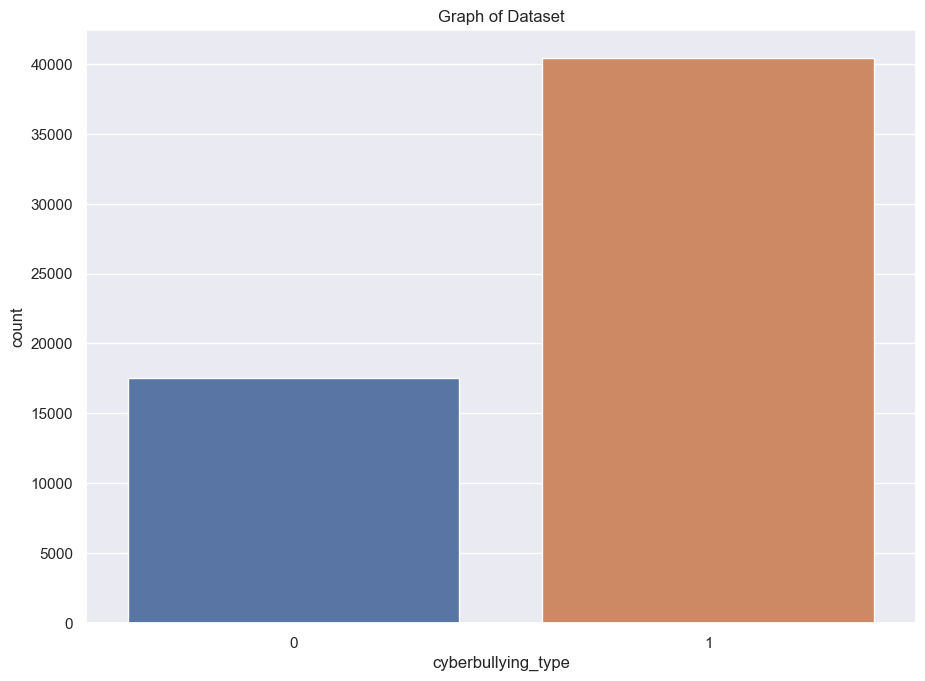

In [13]:
sns.set(rc={'figure.figsize':(10.7,7.7)})
sns.countplot(x='cyberbullying_type',data=final_dataset).set(title="Graph of Dataset")

### 6.  WordCloud of Dataset

In [14]:
text = ''.join(final_dataset["tweet_text"].tolist())

In [15]:
''.join(final_dataset["tweet_text"].tolist())

'In other words your food was crapilicious Why is so white a classy whore Or more red velvet cupcakesmeh P  thanks for the heads up but not too concerned about another angry dude on twitterThis is an ISIS account pretending to be a Kurdish account  Like Islam it is all liesYes the test of god is that good or bad or indifferent or weird or whatever it all proves gods existenceItu sekolah ya bukan tempat bully Ga jauh kaya nerakaKarma I hope it bites Kat on the butt She is just nasty everything but mostly my priestRebecca Black Drops Out of School Due to BullyingThe Bully flushes on KD Ughhhh  Turkish state has killed  children in last  years    Love that the best response to the hotcakes they managed to film was a noncommittal meh from some adolescent PAREM DE FAZER BULLYING COMIGO  UHAHUAH BANDO DE PRETOtadinhu de mim  sofrendo bulling viu MIMItwitter is basically the angry letters of our generationBest pick up line Hi youre cute  I love how people call James Potter is a bully  mypatro

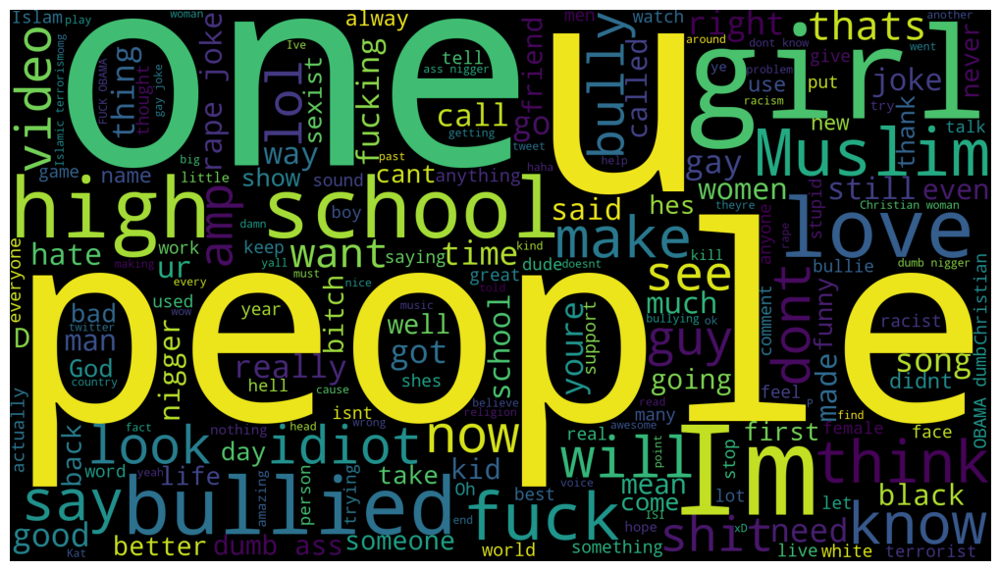

In [16]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### 7. Stopwords

In [17]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\giann\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [18]:
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

### 8. Data pre-processing

In [19]:
final_dataset.shape

(57915, 2)

In [20]:
final_dataset.head()

,tweet_text,cyberbullying_type
0,In other words your food was crapilicious,0
1,Why is so white,0
2,a classy whore Or more red velvet cupcakes,0
3,meh P thanks for the heads up but not too con...,0
4,This is an ISIS account pretending to be a Kur...,0


In [21]:
final_dataset.isnull().sum()

tweet_text            0
cyberbullying_type    0
dtype: int64

In [22]:
#separating tweet_text & cyberbullying_type
X = final_dataset.drop(columns='cyberbullying_type', axis=1)
Y = final_dataset['cyberbullying_type']
X.to_csv('ExportedDatasets/cyberbullying_X.csv')
Y.to_csv('ExportedDatasets/cyberbullying_Y.csv')

In [23]:
print(X)
print(Y)

                                              tweet_text
0             In other words your food was crapilicious 
1                                       Why is so white 
2             a classy whore Or more red velvet cupcakes
3      meh P  thanks for the heads up but not too con...
4      This is an ISIS account pretending to be a Kur...
...                                                  ...
95251                                real by walt disney
95252  She pretty I love this song I miss the old kel...
95253  StatusOnline Im ZxkillergirlzX Im Zxkillergirl...
95254  JR so cute EXO M Better I agree like yeah yeah...
95255  great video and MERRY CHRISTMAS from greece   ...

[57915 rows x 1 columns]
0        0
1        0
2        0
3        0
4        0
        ..
95251    0
95252    1
95253    0
95254    0
95255    0
Name: cyberbullying_type, Length: 57915, dtype: int64


### 9. Stemming: Process of reducing a word to its root word

In [24]:
port_stem = PorterStemmer()

In [25]:
def stemming(content):
    stemmed_content = re.sub('[^a-zA-Z]',' ',content)
    stemmed_content = stemmed_content.lower()
    stemmed_content = stemmed_content.split()
    stemmed_content = [port_stem.stem(word) for word in stemmed_content if not word in stopwords.words('english')]
    stemmed_content = ' '.join(stemmed_content)
    return stemmed_content

In [26]:
final_dataset['tweet_text'] = final_dataset['tweet_text'].apply(stemming)

C:\Users\giann\AppData\Local\Temp\ipykernel_38644\335959773.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_dataset['tweet_text'] = final_dataset['tweet_text'].apply(stemming)


In [27]:
print(final_dataset['tweet_text'])

0                                      word food crapilici
1                                                    white
2                           classi whore red velvet cupcak
3        meh p thank head concern anoth angri dude twitter
4        isi account pretend kurdish account like islam...
                               ...                        
95251                                     real walt disney
95252    pretti love song miss old kelli ok rihanna yes...
95253    statusonlin im zxkillergirlzx im zxkillergirlz...
95254    jr cute exo better agre like yeah yeah yeah wo...
95255    great video merri christma greec ever love son...
Name: tweet_text, Length: 57915, dtype: object


In [28]:
#separating tweet_text & cyberbullying_type
X = final_dataset['tweet_text'].values
Y = final_dataset['cyberbullying_type'].values

In [29]:
print(X)

['word food crapilici' 'white' 'classi whore red velvet cupcak' ...
 'statusonlin im zxkillergirlzx im zxkillergirlzx im freak band band practic who meythmjr'
 'jr cute exo better agre like yeah yeah yeah wow wow check boy il hoon realli look good ling ling fight ling ling talent ling ling fight ahi miss'
 'great video merri christma greec ever love song great videoand love band favorit song one mississippi two mississippi hahahah dwse antrakla xaxaxaxa epikotati parodi taso axx kalampokaki xaxaxa ti yperoxo tragoudi se taideuei remind epic time need speed game best ever song miss game nitro plzz hahahah epic favorit euxaristw para poli apira like sto tragoudi fwnara einai atimo gliko tragoudi ta agapimena xd kai pethana apo ta gelia mpravo gia ti parodi boom ellin pantou xd apeuthia gia eurovis xd joey ador friend team wow yperoxo girli make upkai super diagonismo kali ma epitixia better origin love song sad gorgeou talent gone']


In [30]:
X.shape

(57915,)

In [31]:
print(Y)

[0 0 0 ... 0 0 0]


In [32]:
Y.shape

(57915,)

### 10. Converting the textual data to numerical data

In [33]:
vectorizer = TfidfVectorizer()
vectorizer.fit(X)

X = vectorizer.transform(X)

In [34]:
print(X)

  (0, 61971)	0.35537982749194225
  (0, 19526)	0.4535649079392458
  (0, 11745)	0.8173029135503317
  (1, 61280)	1.0
  (2, 61373)	0.3793859935270697
  (2, 59305)	0.5604710473238607
  (2, 46101)	0.348777527634042
  (2, 12251)	0.4778906970336291
  (2, 10060)	0.438078977963301
  (3, 57747)	0.30994663585531307
  (3, 55250)	0.28063601908226155
  (3, 34755)	0.47007395547597547
  (3, 24072)	0.31493606790167605
  (3, 15532)	0.30500165146818103
  (3, 10868)	0.405724659048357
  (3, 2403)	0.3039651729216033
  (3, 2280)	0.39368632758320754
  (4, 44001)	0.37256163110394797
  (4, 32066)	0.1585572930809848
  (4, 31941)	0.2924821080164572
  (4, 30842)	0.4496375267679533
  (4, 27547)	0.22701208233860792
  (4, 27508)	0.28256130705085086
  (4, 397)	0.6457262183636715
  (5, 62798)	0.23403927069669167
  :	:
  (57914, 19992)	0.045870885616050454
  (57914, 18518)	0.12137931799811572
  (57914, 17434)	0.0926797860676047
  (57914, 17390)	0.11082286630746646
  (57914, 17384)	0.11082286630746646
  (57914, 16908)	0.1

### 11. Train/Test Splitting

In [35]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.4, stratify=Y, random_state=2)

when random_state set to an integer, train_test_split will return same results for each execution.

when random_state set to an None, train_test_split will return different results for each execution.

In [36]:
X_train.shape

(34749, 63838)

In [37]:
X_test.shape

(23166, 63838)

In [38]:
Y_train.shape

(34749,)

### 12. Training the Model: Logistic Regression (LR)

In [39]:
modelLR = LogisticRegression()

In [40]:
modelLR.fit(X_train, Y_train)

LogisticRegression()

#### Evaluation: Accuracy Score

In [41]:
X_train_prediction = modelLR.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)

In [42]:
print('Accuracy score of the training data : ', training_data_accuracy)

Accuracy score of the training data :  0.8664134219689775


In [43]:
X_test_prediction = modelLR.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)

In [44]:
print('Accuracy score of the test data : ', test_data_accuracy)

Accuracy score of the test data :  0.8011741345074679
